# Analysing new car registrations in Great Britain

## Introduction

This project will present an exploratory data analysis of new car registrations in GB. Every single car from the UK driving on the roads today is in the Driver Vehicle Licensing Authority database. Registering your vehicle means putting your car onto the DVLA database, the dealership is the one responsible for this. All vehicles must be registered on the DVLA database. A new registration implies a sale, so we can look at this report as analysing new car sales in Great Britain.

## Objectives

- Analyse and visualise the overall trend of new car registrations in Great Britain over the last 20 years.
- Examine if new car purchasing habits are different in 2001 in comparison to 2019.

## Data used

- Our main dataset "cars.csv" which includes total car registrations in GB by the generic model since Q1 2001 until Q2 2019. This data was obtained from _https://www.gov.uk/government/organisations/department-for-transport/about/statistics_ it is **Table VEH0161**. I have removed data for other types of transportation such as bikes and vans, furthermore i have added features such as manufacturer, country and parent company.
- "CountryCodes.csv" is used for the interactive geographical plot.
- "topcars.csv" is a dataset which I created, including features for some of the most sold car models such as price, MPG, and vehicle class. Some of this information was sourced from a Kaggle dataset _https://www.kaggle.com/CooperUnion/cardataset_, and the rest of this information was found using Google and Wikipedia.
- Financial data scraped using Yahoo finance API.

# Overall trend

## Reading and manipulating the data

For our main dataset "cars.csv" there exists data for both the UK and GB for the last five years. Therefore we remove the data for the UK to make it consistent with the earlier years. There also exists data for some "Missing Models" we correct this by removing the cars which have no known manufacturer. Furthermore, we remove vehicles which have sold less than 75 units in total since 2001, since again there is a lot of missing data for these. For this, we can use Boolean filters.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.animation as animation
from IPython.display import HTML
import plotly.express as px
from pylab import rcParams
import statsmodels.api as sm
df = pd.read_csv('cars.csv', encoding = 'unicode_escape')
cols = [c for c in df.columns if c.upper()[-2:] != 'UK']
df = df[cols]
df = df[df.Manufacturer.notnull()]
df['Total'] = df.sum(axis = 1, skipna = True)
df = df[df.Total >= 75]
df.head()

,Generic Model,Manufacturer,Country,Parent Company,2019 Q2 GB,2019 Q1 GB,2018 Q4 GB,2018 Q3 GB,2018 Q2 GB,2018 Q1 GB,...,2003 Q1 GB,2002 Q4 GB,2002 Q3 GB,2002 Q2 GB,2002 Q1 GB,2001 Q4 GB,2001 Q3 GB,2001 Q2 GB,2001 Q1 GB,Total
0,FORD FIESTA,FORD,United States,Ford Motor Company,19405.0,23030.0,16394.0,22716.0,23194.0,32239.0,...,24981.0,16942.0,26615.0,23550.0,25436.0,20333.0,30293.0,23461.0,26188.0,1896573.0
1,FORD FOCUS,FORD,United States,Ford Motor Company,15161.0,16315.0,10230.0,9299.0,14821.0,15230.0,...,37213.0,29206.0,37502.0,39165.0,46376.0,29298.0,38215.0,33878.0,38884.0,1863572.0
2,VAUXHALL CORSA,VAUXHALL,United Kingdom,Groupe PSA,12155.0,17419.0,9719.0,15433.0,12236.0,15066.0,...,32118.0,19483.0,29346.0,26006.0,28866.0,20628.0,27771.0,22455.0,22142.0,1541491.0
3,VOLKSWAGEN GOLF,VOLKSWAGEN,Germany,Volkswagen Group,13830.0,16556.0,12858.0,12357.0,19022.0,21374.0,...,20659.0,16820.0,22297.0,22873.0,23150.0,16234.0,21608.0,18994.0,20061.0,1298361.0
4,VAUXHALL ASTRA,VAUXHALL,United Kingdom,Groupe PSA,4663.0,7629.0,7591.0,6842.0,6814.0,9033.0,...,30155.0,20513.0,28731.0,23343.0,27858.0,19287.0,25676.0,24068.0,28484.0,1383065.0


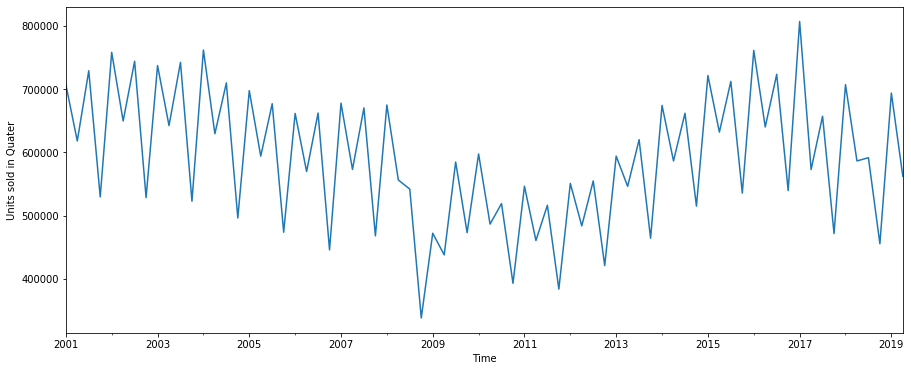

In [2]:
dfTime = df.iloc[0:, 4:78]
dfTime = dfTime.sum()
dfTime = dfTime.iloc[::-1]
dfTime.index = dfTime.index.str.replace(r' GB', '')
dfTime.index = dfTime.index.str.replace(r' ', '')
dfTime.index = pd.to_datetime(dfTime.index)
dfTime.plot(figsize=(15, 6))
plt.xlabel("Time")
plt.ylabel("Units sold in Quater")
plt.show()

## Looking at a time series decomposition of the data

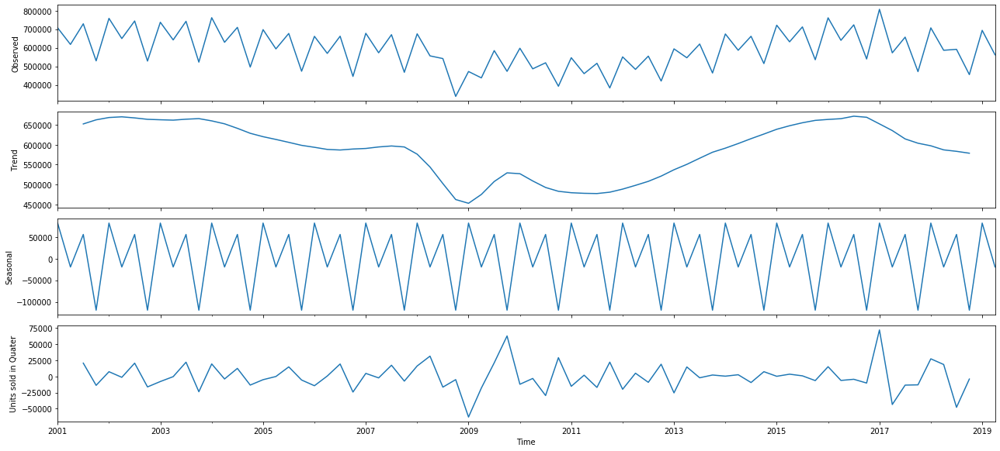

In [3]:
rcParams['figure.figsize'] = 18, 8
decomposition = sm.tsa.seasonal_decompose(dfTime, model='additive')
fig = decomposition.plot()
plt.xlabel("Time")
plt.ylabel("Units sold in Quater")
plt.show()

From this graph which starts at 2001 Q1, we can see there is clear seasonality. Q1 and Q3 have the highest number of registrations, likely because this is when the new yearly plates come out. Q4 have significantly fewer new registrations, likely because people would prefer to wait a few more months for the new plates next year. 

There seems to be a downward trend since 2016 Q2, likely due to the weakening of the pound since the decision to leave the European Union. This is because as we will see from later on in this report, a large proportion of cars are imported from Europe. 

New registrations were also at a lower level in 2008 until 2012, when they started recovering. This is likely due to the effects of the financial crisis. Another interesting observation is that the highest levels of sales were seen from 2001 to 2004 and again from 2015 to 2016.

                              ARMA Model Results                              
Dep. Variable:                      y   No. Observations:                   74
Model:                     ARMA(4, 2)   Log Likelihood                -887.953
Method:                       css-mle   S.D. of innovations          37108.597
Date:                Tue, 28 Jan 2020   AIC                           1791.906
Time:                        21:09:05   BIC                           1810.338
Sample:                    01-01-2001   HQIC                          1799.259
                         - 04-01-2019                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       5.906e+05   3.52e+04     16.793      0.000    5.22e+05    6.59e+05
ar.L1.y       -0.0643      0.049     -1.300      0.198      -0.161       0.033
ar.L2.y       -0.0412      0.045     -0.908      0.3

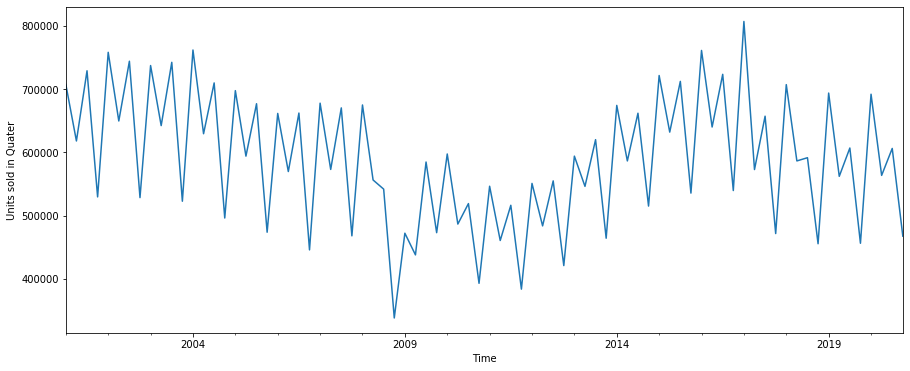

In [5]:
from statsmodels.tsa.arima_model import ARMA
import warnings
# fit model
model = ARMA(dfTime, order=(4, 2))
model_fit = model.fit(disp=False)
# make prediction
yhat = model_fit.predict(len(dfTime), len(dfTime)+5)
print(model_fit.summary())
dfTime1 = dfTime.append(yhat)
dfTime1.plot(figsize=(15, 6))
plt.xlabel("Time")
plt.ylabel("Units sold in Quater")
plt.show()
warnings.simplefilter('ignore')

The above graph shows a forecast for new car registrations over the next five quarters; however, many external factors are likely to have an impact on this prediction. The value of the pound is forecasted to rise, which makes imported cars cheaper to buy. New car innovations such as the advancement of electric cars and autonomous driving are also likely to have a significant impact in the near future.

## Where are our cars from?

In [6]:
dfP1 = pd.pivot_table(df, values = "Total", index = "Country", aggfunc='sum')
dfP1 = dfP1.sort_values('Total',ascending=False)
dfP2 = pd.read_csv('CountryCodes.csv', encoding = 'unicode_escape')
dfP = pd.merge(dfP1, dfP2, how='left', on="Country")
fig = px.choropleth(dfP, locations=dfP["CODE"],
                    color = "Total", # lifeExp is a column of gapminder
                    hover_name = 'Country', # column to add to hover information
                    color_continuous_scale=px.colors.sequential.Plasma)
fig.show()

As we can see from the interactive graph above, Germany is the most popular country to buy cars from. Cars from the UK are the next most popular and Japan, USA and France follow next.

## What are the most popular car brands?

In [8]:
colours = {"FORD":"#0031FF", "VAUXHALL":"#D602C2", "BMW":"#E00000", "RENAULT":"#00FFFD", "AUDI": "#9D00DC", 
           "FIAT": "#00FF2D", "MERCEDES":"#EDC500", "NISSAN":"#000000",  "PEUGEOT": "#5FEEB4", "VOLKSWAGEN": "#B6B6B6", 
           "CITROEN": "#EBF500", "ROVER": "#D3D3D3", "HONDA": "#B80000", "TOYOTA": "#AB5AFF", "HYUNDAI": "#5A84FF", 
           "MINI": "#06AA0F", "LAND-ROVER": "#D3D3D3", "KIA": "#ABCDEF"}

col = list(df.columns.values)[77:3:-1]
dfA = pd.pivot_table(df, index="Manufacturer",aggfunc='sum')
dfA = dfA.sort_values('Total',ascending=False)
fig, ax = plt.subplots(figsize=(15, 8))

def draw_barchart(current_quater):
    dfA1 = dfA[[current_quater]].sort_values(by=[current_quater], ascending=False).head(8)
    dfA1 = dfA1[::-1]
    ax.clear()
    ax.barh(dfA1.index, dfA1[current_quater], color=[colours[x] for x in dfA1.index])
    ax.text(0, 1.05, 'The most popular car brands in GB from 2001 to 2019',
            transform=ax.transAxes, size=22, weight=600, ha='left', va='top')
    ax.text(1, 0.3, current_quater.strip("GB"), transform=ax.transAxes, color='#777777', size=36, ha='right', weight=800)
animator = animation.FuncAnimation(fig, draw_barchart, frames=col, interval = 500)
plt.close()
HTML(animator.to_jshtml())

As we can see from the animated bar plot( _press play_ ), ford has been the most popular brand over this period. Vauxhall has been second for the majority of the last two decades. Interestingly since 2010, there has been a rise in popularity of luxury brands Audi, BMW and Mercedes, with all three everpresent in the top eight since 2011 Q2. Below we can see descriptive statistics for each of the brands.

In [9]:
dfA1 = dfA.drop('Total', axis=1)
dfA1 = dfA1.transpose()
dfA1.describe()

Manufacturer,FORD,VAUXHALL,VOLKSWAGEN,BMW,PEUGEOT,AUDI,MERCEDES,RENAULT,TOYOTA,NISSAN,...,AC,GINETTA,CORVETTE,MAGIRUS,LIGIER,LDV,RILEY,JIALING,SIMCA,DE-TOMASO
count,74.000000,74.000000,74.000000,74.000000,74.000000,74.000000,74.000000,74.000000,74.000000,74.000000,...,74.000000,74.000000,74.000000,74.000000,74.000000,74.000000,74.000000,74.000000,74.000000,74.000000
mean,80921.918919,66368.891892,47437.702703,31656.797297,31232.202703,28277.986486,26761.054054,26601.891892,26487.770270,26090.054054,...,2.527027,2.297297,2.270270,2.162162,2.013514,1.729730,1.702703,1.702703,1.256757,1.027027
std,17923.534172,14933.767632,6510.590165,8160.668516,11914.490373,10448.710835,10105.675583,14468.364766,6802.772164,8238.134309,...,1.615193,2.898888,3.555036,3.546277,5.279823,3.616163,1.567912,2.991906,2.421710,1.181744
min,47998.000000,33361.000000,31358.000000,17217.000000,14328.000000,12008.000000,11558.000000,7900.000000,14540.000000,8652.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,66022.250000,56620.000000,43321.750000,25796.500000,23082.250000,19229.750000,19421.750000,15103.500000,20998.750000,21195.500000,...,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,81043.500000,65210.000000,47321.500000,29750.000000,28236.000000,25620.000000,22794.000000,21039.000000,25750.000000,24637.500000,...,2.000000,1.500000,0.000000,0.500000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000
75%,92544.000000,77442.250000,51689.500000,37427.500000,38991.750000,37375.500000,32464.000000,40597.250000,32391.500000,30117.750000,...,3.000000,3.000000,4.000000,2.750000,0.000000,1.750000,3.000000,2.000000,1.000000,2.000000
max,121096.000000,95022.000000,61162.000000,48882.000000,62621.000000,48449.000000,53937.000000,57587.000000,39303.000000,52882.000000,...,7.000000,18.000000,13.000000,18.000000,26.000000,16.000000,7.000000,15.000000,13.000000,5.000000


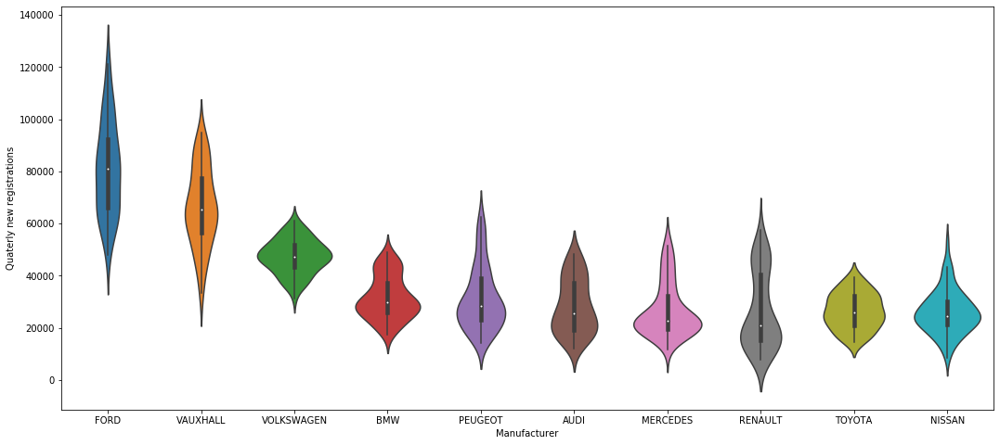

In [10]:
import seaborn as sns
dfA2 = dfA1.loc[:,'FORD':'NISSAN']
ax = sns.violinplot(data=dfA2)
plt.ylabel('Quaterly new registrations')
plt.show()

The above violin plot provides us with another way to visualise the data. We can see that Volkswagen and Toyota have been the most consistent in their quarterly sales.

## What are the most prominent automotive manufacturing groups.

Many car brands are part of larger automotive manufacturing groups. For example, Volkswagen, Audi, Bentley, Bugatti, and Lamborghini are all part of the Volkswagen group. The following animated pie chart( _press play_ ) shows how the market share of these groups in Great Britain evolves over time. I have classified brands with no larger group as Independent. I am using group composition from now (December 2019). For example, Land Rover has been placed under Indian automotive company Tata Motors throughout the period in my graph, even though the takeover happened on 18 January 2008.
Groupe PSA and Fiat Chrysler Automobiles are expected to merge soon, however, as this is not yet official, I treat both of these entities as separate.

In [11]:
colours_C = {"Ford Motor Company": "#BEBEBE", "Groupe PSA" : "#00CCCC", "Volkswagen Group" : "#CC0033", 
             "BMW Group" : "#6666FF", "Daimler AG" : "#83fff6", "Tata Motors" : "#d09d00", "Hyundai Motor Group" : "#cc9933",
             "Fiat Chrysler Automobiles" : "#ff5227", "Honda Motor Company" : "#ffde54", 
             "Renault-Nissan-Mitsubishi Alliance" : "#66CC66", "Independent" : "#7129ff", "Toyota Group": "#a50021"}

dfC = pd.pivot_table(df, index="Parent Company",aggfunc='sum')
dfC = dfC.sort_values('Total',ascending=False)
fig, ax = plt.subplots(figsize=(15, 8))

def draw_barchart(current_quater):
    dfC1 = dfC[[current_quater]].sort_values(by=[current_quater], ascending=False).head(8)
    dfC1 = dfC1[::-1]
    ax.clear()
    ax.pie(dfC1[current_quater], labels = dfC1.index, autopct='%1.1f%%', colors = [colours_C[x] for x in dfC1.index])
    ax.text(-0.5, 1.1, 'Biggest automotive manufacturing groups in GB from 2001 to 2019',
            transform=ax.transAxes, size=22, weight=600, ha='left', va='top')
    ax.text(1, 0, current_quater.strip("GB"), transform=ax.transAxes, color='#777777', size=36, ha='right', weight=800)
animator = animation.FuncAnimation(fig, draw_barchart, frames=col, interval = 500)
plt.close()
HTML(animator.to_jshtml())

As we can see from the pie chart, the Volkswagen group has been the biggest winner over the last two decades. It came from third place in 2001 to holding first place since 2013 Q2 and has since further extended its lead over Groupe PSA.

Below we will look at the stock market data for these companies, using the Yahoo finance API.

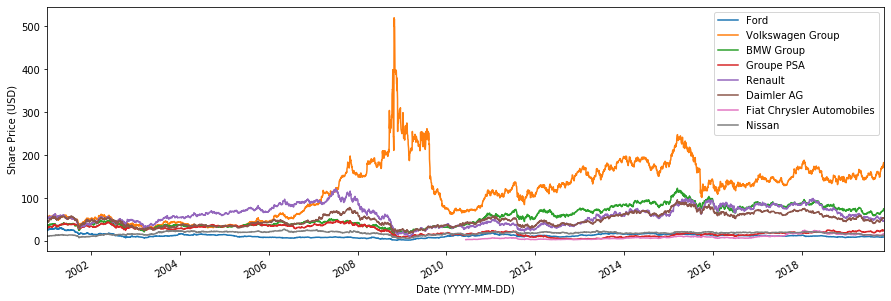

In [12]:
import pandas_datareader as pdr
df1 = pdr.data.get_data_yahoo("F", start = "2001-01-01", end = "2019-11-10")#Getting data through Yahoo API
df2 = pdr.data.get_data_yahoo("VOW.DE", start = "2001-01-01", end = "2019-11-10")
df3 = pdr.data.get_data_yahoo("BMW.DE", start = "2001-01-01", end = "2019-11-10")
df4 = pdr.data.get_data_yahoo("UG.PA", start = "2001-01-01", end = "2019-11-10")
df5 = pdr.data.get_data_yahoo("RNO.PA", start = "2001-01-01", end = "2019-11-10")
df6 = pdr.data.get_data_yahoo("DAI.DE", start = "2001-01-01", end = "2019-11-10")
df7 = pdr.data.get_data_yahoo("FCAU", start = "2001-01-01", end = "2019-11-10")
df8 = pdr.data.get_data_yahoo("NSANY", start = "2001-01-01", end = "2019-11-10")
ax = df1["Close"].plot(label='Ford', figsize=(15,5))
ax = df2["Close"].plot(label='Volkswagen Group')
ax = df3["Close"].plot(label='BMW Group')
ax = df4["Close"].plot(label='Groupe PSA')
ax = df5["Close"].plot(label='Renault')
ax = df6["Close"].plot(label='Daimler AG')
ax = df7["Close"].plot(label='Fiat Chrysler Automobiles')
ax = df8["Close"].plot(label='Nissan')
ax.set(xlabel='Date (YYYY-MM-DD)', ylabel='Share Price (USD)')
ax.legend(loc='upper right')
plt.show()

In October 2008 Volkswagen (VOWG.DE) briefly became the world’s biggest company by market value. The share price had rocketed since Porsche revealed in a surprise announcement that it had effectively gained control of 74 per cent of Volkswagen’s voting shares. The September 2015 dip in share price was due to Volkswagen admitting cheating emissions tests in the US.

## Car purchasing habits in 2001 vs 2019

Here we look at the difference in car purchasing habits in the year 2001 compared to the most recent year (Q3 2018 to Q2 2019 _inclusive_ ). We look at the top 100 cars in each period as this is representative of overall sales in each period. The top 100 vehicles make up around 80% of the sales in each period.

As we need more information about each car we make use of another dataset "topcars.csv", this is a dataset which I created including features for some of the most sold car models such as price, MPG, and vehicle class. More information about this dataset is in the introduction. 

First, we take a look at an animated plot ( _Press play_ ) of the top 10 most sold cars in each quarter from 2001 to 2019.

In [13]:
colours = {"FORD":"#0031FF", "VAUXHALL":"#D602C2", "BMW":"#E00000", "RENAULT":"#00FFFD", "AUDI": "#9D00DC", "FIAT": "#00FF2D", 
           "MERCEDES":"#EDC500", "NISSAN":"#000000",  "PEUGEOT": "#5FEEB4", "VOLKSWAGEN": "#B6B6B6", "CITROEN": "#EBF500", 
           "ROVER": "#D3D3D3", "HONDA": "#B80000", "TOYOTA": "#AB5AFF", "HYUNDAI": "#5A84FF", "MINI": "#06AA0F", 
           "LAND-ROVER": "#D3D3D3", "KIA": "#ABCDEF"}
col = list(df.columns.values)[77:3:-1] 

def draw_barchart(current_quater):
    dff = df[['Generic Model', current_quater]].sort_values(by=[current_quater], ascending=False).head(10)
    dff = dff[::-1]
    #print(dff)
    ax.clear()
    ax.barh(dff['Generic Model'], dff[current_quater], color=[colours[x.split(" ")[0]] for x in dff['Generic Model']])
    ax.text(0, 1.05, 'Top 10 selling cars in each quater in GB from 2001 to 2019',
            transform=ax.transAxes, size=22, weight=600, ha='left', va='top')
    ax.text(1, 0.3, current_quater.strip("GB"), transform=ax.transAxes, color='#777777', size=36, ha='right', weight=800)
fig, ax = plt.subplots(figsize=(15, 8))
animator = animation.FuncAnimation(fig, draw_barchart, frames=col, interval = 500)
plt.close()
HTML(animator.to_jshtml())

We can see from the above graph the consistent success of the Ford Focus, Ford Fiesta, Volkswagen Golf and Vauxhall Corsa, which are all everpresent in the top 10 for every quarter.

### Top 100 cars in the most recent period

In [14]:
dfOther = pd.read_csv('topcars.csv', encoding = 'unicode_escape')
dfNew = df.loc[:, :'2018 Q3 GB']
dfNew['Total'] = dfNew.sum(axis = 1, skipna = True)
dfNew = dfNew.sort_values(by=['Total'], ascending=False).head(100)
dfNew = pd.merge(dfNew, dfOther, how='left', on="Generic Model")
dfNew['Combined_MPG'] = (dfNew['highway MPG'] + dfNew['city mpg'])/2
dfNew.head()

,Generic Model,Manufacturer,Country,Parent Company,2019 Q2 GB,2019 Q1 GB,2018 Q4 GB,2018 Q3 GB,Total,Engine_HP,Driven_Wheels,Number of Doors,Luxury,Vehicle_Size,Vehicle_Style,highway MPG,city mpg,MSRP,Combined_MPG
0,FORD FIESTA,FORD,United States,Ford Motor Company,19405.0,23030.0,16394.0,22716.0,81545.0,120.0,front wheel drive,4.0,0.0,Compact,Sedan,35.0,27.0,15360.0,31.0
1,VOLKSWAGEN GOLF,VOLKSWAGEN,Germany,Volkswagen Group,13830.0,16556.0,12858.0,12357.0,55601.0,170.0,front wheel drive,4.0,0.0,Compact,Hatchback,36.0,25.0,19895.0,30.5
2,VAUXHALL CORSA,VAUXHALL,United Kingdom,Groupe PSA,12155.0,17419.0,9719.0,15433.0,54726.0,55.0,front wheel drive,4.0,0.0,Compact,Hatchback,51.0,44.0,10000.0,47.5
3,FORD FOCUS,FORD,United States,Ford Motor Company,15161.0,16315.0,10230.0,9299.0,51005.0,160.0,front wheel drive,4.0,0.0,Compact,Hatchback,40.0,27.0,19765.0,33.5
4,LAND-ROVER RANGE ROVER,LAND-ROVER,United Kingdom,Tata Motors,10828.0,15695.0,11483.0,11970.0,49976.0,240.0,all wheel drive,4.0,0.0,Large,SUV,29.0,21.0,45800.0,25.0


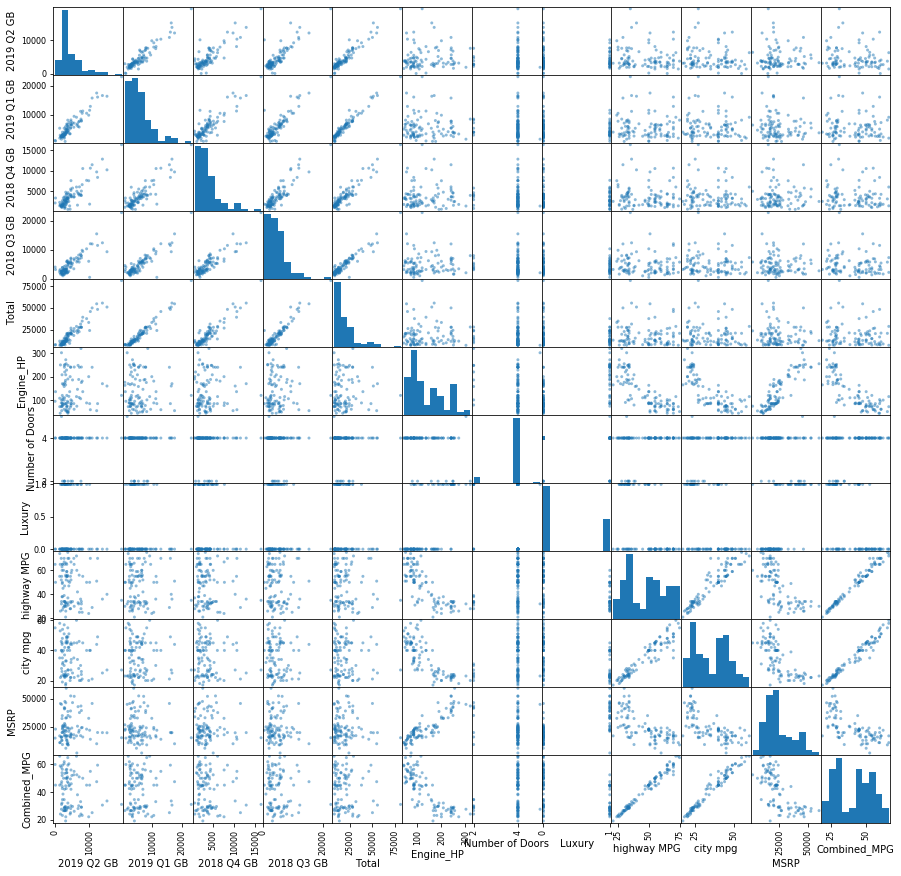

In [15]:
pd.plotting.scatter_matrix(dfNew._get_numeric_data(),figsize=(15, 15))
plt.show()

From the scatterplots above we can see that there are some highly correlated variables, so we need to remove these before continuing with the modelling. We also rescale the dataset.

In [16]:
dfNew.drop(dfNew.columns[[1, 3, 4, 5, 6, 7, 15, 16]],axis=1,inplace=True)
dfNew = dfNew.fillna(value = 0)
from sklearn import preprocessing
names = ["Total", "Engine_HP", "MSRP", "Combined_MPG"]
# Create the Scaler object
scaler = preprocessing.StandardScaler()
# Fit your data on the scaler object
scaled_df = scaler.fit_transform(dfNew[["Total", "Engine_HP", "MSRP", "Combined_MPG"]])
scaled_df = pd.DataFrame(scaled_df, columns=names)
scaled_df["Generic Model"] = dfNew["Generic Model"]
dfNew.drop(dfNew.columns[[1, 2, 3, 9, 10]],axis=1,inplace=True)
scaled_df = pd.merge(dfNew, scaled_df, how='outer', on="Generic Model")
scaled_df['4_Doors'] = np.where(scaled_df['Number of Doors']==4, 1, 0)
scaled_df.drop('Number of Doors',axis=1,inplace=True)
scaled_df = scaled_df.set_index("Generic Model")
scaled_df = pd.get_dummies(scaled_df, dtype=np.int)
scaled_df.head()

,Luxury,Total,Engine_HP,MSRP,Combined_MPG,4_Doors,Driven_Wheels_0,Driven_Wheels_all wheel drive,Driven_Wheels_front wheel,Driven_Wheels_front wheel drive,...,Vehicle_Size_Compact,Vehicle_Size_Large,Vehicle_Size_Midsize,Vehicle_Style_0,Vehicle_Style_Convertible,Vehicle_Style_Coupe,Vehicle_Style_Hatchback,Vehicle_Style_SUV,Vehicle_Style_Sedan,Vehicle_Style_Wagon
Generic Model,,,,,,,,,,,,,,,,,,,,,
FORD FIESTA,0.0,4.878364,-0.163095,-0.685506,-0.663969,1,0,0,0,1,...,1,0,0,0,0,0,0,0,1,0
VOLKSWAGEN GOLF,0.0,2.864448,0.532108,-0.312413,-0.699475,1,0,0,0,1,...,1,0,0,0,0,0,1,0,0,0
VAUXHALL CORSA,0.0,2.796525,-1.066858,-1.126472,0.507741,1,0,0,0,1,...,1,0,0,0,0,0,1,0,0,0
FORD FOCUS,0.0,2.507681,0.393068,-0.323108,-0.486437,1,0,0,0,1,...,1,0,0,0,0,0,1,0,0,0
LAND-ROVER RANGE ROVER,0.0,2.427804,1.505392,1.818783,-1.090045,1,0,1,0,0,...,0,1,0,0,0,0,0,1,0,0


In [17]:
%%capture
import rpy2.robjects.packages as r
utils = r.importr("utils")
package_name = "leaps"
utils.install_packages(package_name)
package_name = "base"
utils.install_packages(package_name)

In [18]:
%%capture
leaps = r.importr('leaps')
base = r.importr('base')
from rpy2.robjects import pandas2ri, Formula
pandas2ri.activate()
scaled_df_r = pandas2ri.py2ri(scaled_df)
formula = Formula('Total ~ .')
result_full = leaps.regsubsets(formula, data=scaled_df_r,nvmax=12)
result_full[-1][2] = 'scaled_df_r'
summary_full = base.summary(result_full)
print(summary_full)

In [19]:
import statsmodels.formula.api as smf
results = smf.ols("Total ~ Luxury + Vehicle_Style_Sedan + Combined_MPG + Vehicle_Size_Compact", data=scaled_df).fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                  Total   R-squared:                       0.150
Model:                            OLS   Adj. R-squared:                  0.114
Method:                 Least Squares   F-statistic:                     4.190
Date:                Tue, 28 Jan 2020   Prob (F-statistic):            0.00361
Time:                        21:35:08   Log-Likelihood:                -133.77
No. Observations:                 100   AIC:                             277.5
Df Residuals:                      95   BIC:                             290.6
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
Intercept               -0.4205 

Above we can see the linear model for the most popular car models in the last year. This model was selected using best subsets selection. We can see that the being Compact and a Sedan have a positive influence on sales. It is interesting that being Luxury and having a higher Combined_MPG have a negative effect on total sales. This may be due to luxury cars being more expensive. Next, we model the top 100 cars a decade ago.

### Top 100 cars in 2001

In [20]:
dfOld = df.loc[:, :'2001 Q1 GB']
dfOld.drop(dfOld.columns[list(range(4, 74))],axis=1,inplace=True)
dfOld['Total'] = dfOld.sum(axis = 1, skipna = True)
dfOld = dfOld.sort_values(by=['Total'], ascending=False).head(100)
dfOld = pd.merge(dfOld, dfOther, how='left', on="Generic Model")
dfOld['Combined_MPG'] = (dfOld['highway MPG'] + dfOld['city mpg'])/2
dfOld.head()

,Generic Model,Manufacturer,Country,Parent Company,2001 Q4 GB,2001 Q3 GB,2001 Q2 GB,2001 Q1 GB,Total,Engine_HP,Driven_Wheels,Number of Doors,Luxury,Vehicle_Size,Vehicle_Style,highway MPG,city mpg,MSRP,Combined_MPG
0,FORD FOCUS,FORD,United States,Ford Motor Company,29298.0,38215.0,33878.0,38884.0,140275.0,160.0,front wheel drive,4.0,0.0,Compact,Hatchback,40.0,27.0,19765.0,33.5
1,FORD FIESTA,FORD,United States,Ford Motor Company,20333.0,30293.0,23461.0,26188.0,100275.0,120.0,front wheel drive,4.0,0.0,Compact,Sedan,35.0,27.0,15360.0,31.0
2,VAUXHALL ASTRA,VAUXHALL,United Kingdom,Groupe PSA,19287.0,25676.0,24068.0,28484.0,97515.0,77.0,front wheel drive,4.0,0.0,Compact,Hatchback,67.0,45.0,18000.0,56.0
3,PEUGEOT 206,PEUGEOT,France,Groupe PSA,17855.0,27762.0,22609.0,28859.0,97085.0,75.0,front wheel drive,4.0,0.0,Compact,Hatchback,50.0,40.0,10000.0,45.0
4,VAUXHALL CORSA,VAUXHALL,United Kingdom,Groupe PSA,20628.0,27771.0,22455.0,22142.0,92996.0,55.0,front wheel drive,4.0,0.0,Compact,Hatchback,51.0,44.0,10000.0,47.5


In [21]:
%%capture
dfOld.drop(dfOld.columns[[1, 3, 4, 5, 6, 7, 15, 16]],axis=1,inplace=True)
dfOld = dfOld.fillna(value = 0)
from sklearn import preprocessing
names = ["Total", "Engine_HP", "MSRP", "Combined_MPG"]
# Create the Scaler object
scaler = preprocessing.StandardScaler()
# Fit your data on the scaler object
scaled_df2 = scaler.fit_transform(dfOld[["Total", "Engine_HP", "MSRP", "Combined_MPG"]])
scaled_df2 = pd.DataFrame(scaled_df2, columns=names)
scaled_df2["Generic Model"] = dfOld["Generic Model"]
dfOld.drop(dfOld.columns[[1, 2, 3, 9, 10]],axis=1,inplace=True)
scaled_df2 = pd.merge(dfOld, scaled_df2, how='outer', on="Generic Model")
scaled_df2['Has_4Doors'] = np.where(scaled_df2['Number of Doors']==4, 1, 0)
scaled_df2.drop('Number of Doors',axis=1,inplace=True)
scaled_df2 = scaled_df2.set_index("Generic Model")
scaled_df2 = pd.get_dummies(scaled_df2, dtype=np.int)
scaled_df_r2 = pandas2ri.py2ri(scaled_df2)
formula = Formula('Total ~ .')
result_full2 = leaps.regsubsets(formula, data=scaled_df_r2,nvmax=12)
result_full2[-1][2] = 'scaled_df_r2'
summary_full2 = base.summary(result_full2)
print(summary_full2)

In [22]:
results = smf.ols("Total ~ Luxury + Vehicle_Style_SUV + Combined_MPG + Has_4Doors", data=scaled_df2).fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                  Total   R-squared:                       0.184
Model:                            OLS   Adj. R-squared:                  0.150
Method:                 Least Squares   F-statistic:                     5.363
Date:                Tue, 28 Jan 2020   Prob (F-statistic):           0.000615
Time:                        21:37:33   Log-Likelihood:                -131.71
No. Observations:                 100   AIC:                             273.4
Df Residuals:                      95   BIC:                             286.5
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept            -0.1038      0.21

Interestingly we get a different model for the 2001 dataset; it seems that again luxury has a negative effect on sales, alongside the SUV body style. Now we combined MPG has a positive impact on registrations, contrary to the 2018-2019 dataset. Having four doors also seems to boost sales, likely due to the practicality that they offer. We will now fit the old model ( _ for the 2018-2019 period_ ) to this 2001 dataset.

In [23]:
results = smf.ols("Total ~ Luxury + Vehicle_Style_Sedan + Combined_MPG + Vehicle_Size_Compact", data=scaled_df2).fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                  Total   R-squared:                       0.147
Model:                            OLS   Adj. R-squared:                  0.111
Method:                 Least Squares   F-statistic:                     4.079
Date:                Tue, 28 Jan 2020   Prob (F-statistic):            0.00428
Time:                        21:38:59   Log-Likelihood:                -133.97
No. Observations:                 100   AIC:                             277.9
Df Residuals:                      95   BIC:                             291.0
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
Intercept               -0.0143 

## Conclusion

### Objective 1: Analyse and visualise the overall trend of new car registrations in Great Britain over the last 20 years.

We observe a strong seasonality in new car registrations. We see that overall new car registrations have fallen in the period overall, this may be due to people using their cars for a more extended amount of time, or maybe a new preference for other modes of transportation. The financial crisis and the weakening of the pound are also likely significant factors. We have also observed a preference for German cars throughout the period. What has been another interesting observation is the rise of the Volkswagen Group which have more than doubled their market share from 13.7% in Q1 2001 to 27.1% in Q2 2019.


### Objective 2: Examine if new car purchasing habits are different in 2001 in comparison to 2019.

We can see from the animated bar graph and statistical analysis conducted above that there does seem to be a difference in purchasing habits from 2001 to 2019. It seems that now there is a greater preference for Compact cars along with Sedans, whereas earlier there was a greater emphasis placed on fuel economy. We also see the Nissan Qashqai increase in popularity where it is ever in the top 10 this decade. However, this difference is slight. Looking at the animated bar graph, we can see the same cars dominating the top 10 most sold models over the last two decades: the Ford Focus, Ford Fiesta, Volkswagen Golf and Vauxhall Corsa which are all ever-present. The Vauxhall Astra has only missed five quarters. 